### MATH2504 S2, 2023, BigHW Submission 
### Submission form IV of IV 

Student #1 name: Matthew Lynch

Student #1 ID: 47426557

Student #2 name: Felicity Caruana

Student #2 ID: 47425523

GitHub repo: https://github.com/lynchmatt/Matthew-Lynch_Felicity-Caruana-2504-2023-BigHW

---

**Note: It is expected that this notebook be runnable in the sense that the marker can select "Restart & Run All" and all code cells of solutions will execute. This requires not to have name clashes between solutions.**

---

In [1]:
# PACKAGES NEEDED

import Pkg; Pkg.add("LaTeXStrings")
import Pkg; Pkg.add("Plots")
import Pkg; Pkg.add("LinearAlgebra")
import Pkg; Pkg.add("StatsBase")
import Pkg; Pkg.add("Measures")
import Pkg; Pkg.add("DifferentialEquations")



   Resolving package versions...
  No Changes to `C:\Users\1908l\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\1908l\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\1908l\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\1908l\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\1908l\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\1908l\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\1908l\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\1908l\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\1908l\.julia\environments\v1.9\Project.toml`
  No Changes to `C:\Users\1908l\.julia\environments\v1.9\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\1908l\.julia\environments\v1.9\Project.toml`
  No Changes to 

# Solution to [Question 13](https://courses.smp.uq.edu.au/MATH2504/2023/assessment_html/bighw.html#q13)

## 13a:

For f1, the minimum error under the forward difference scheme is 
    1.2379932931384672e-10 
    and occurs when h is 1.1748975549395302e-8
For f2, the minimum error under the forward difference scheme is 
    6.726927240060724e-11 
    and occurs when h is 8.511380382023759e-10
For f3, the minimum error under the forward difference scheme is 
    2.8368829432677382e-9 
    and occurs when h is 5.248074602497734e-9
For f1, the minimum error under the central difference scheme is 
    4.936240029333103e-15 
    and occurs when h is 4.073802778041131e-6
For f2, the minimum error under the central difference scheme is 
    6.578961862390812e-13 
    and occurs when h is 4.365158322401657e-6
For f3, the minimum error under the central difference scheme is 
    3.575328270900886e-9 
    and occurs when h is 0.002454708915685031


┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\1908l\.julia\packages\PlotUtils\mHQ0Q\src\ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\1908l\.julia\packages\PlotUtils\mHQ0Q\src\ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\1908l\.julia\packages\PlotUtils\mHQ0Q\src\ticks.jl:191


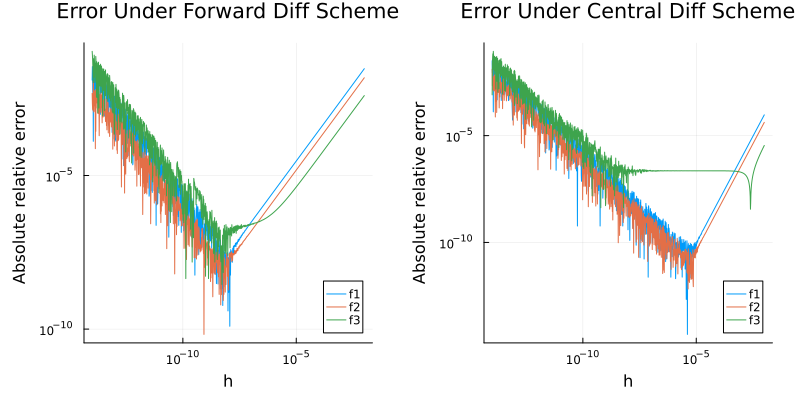

┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\1908l\.julia\packages\PlotUtils\mHQ0Q\src\ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\1908l\.julia\packages\PlotUtils\mHQ0Q\src\ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\1908l\.julia\packages\PlotUtils\mHQ0Q\src\ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils C:\Users\1908l\.julia\packages\PlotUtils\mHQ0Q\src\ticks.jl:191


In [26]:
using Plots, LaTeXStrings

# define functions to find numerical derivatives under the forward and central diff schemes
diff_forward(f, x; h=sqrt(eps())) = (f(x+h)-f(x))/h
diff_central(f, x; h=sqrt(eps())) = (f(x+(h/2))-f(x-(h/2)))/h

# define the functions
f1(x) = cos(x^2)
f2(x) = exp(x^2)
f3(x) = atan(x)/(1+exp(-4*x^2))

# define the analytical derivatives for the above functions
f1prime(x) = -sin(x^2)*2*x
f2prime(x) = exp(x^2)*2*x
f3prime(x) = (1+exp(-4*x^2)+8*exp(-4*x^2)*x*atan(x)*(x^2+1))/(x^2+1)*(1+exp(-4*x^2)^2)

# create plot of the error of forward diff vs analytical diff
h_range = 10 .^ (-14:0.01:-2)
forward_error_f1 = [abs(diff_forward(f1, 1/2; h=h) - 
        f1prime(1/2))/abs(f1prime(1/2)) for h in h_range]
forward_error_f2 = [abs(diff_forward(f2, 1; h=h) - 
        f2prime(1))/abs(f2prime(1)) for h in h_range]
forward_error_f3 = [abs(diff_forward(f3, 2; h=h) - 
        f3prime(2))/abs(f3prime(2)) for h in h_range]
forward_error_plot = plot(h_range, [forward_error_f1, 
        forward_error_f2, forward_error_f3], yaxis = :log, 
    axis = :log, xlabel="h", ylabel="Absolute relative error", 
    label = ["f1" "f2" "f3"], legend= :bottomright, 
    title="Error Under Forward Diff Scheme")

# create plot of the error of central diff vs analytical diff
central_error_f1 = [abs(diff_central(f1, 1/2; h=h) - 
        f1prime(1/2))/abs(f1prime(1/2)) for h in h_range]
central_error_f2 = [abs(diff_central(f2, 1; h=h) - 
        f2prime(1))/abs(f2prime(1)) for h in h_range]
central_error_f3 = [abs(diff_central(f3, 2; h=h) - 
        f3prime(2))/abs(f3prime(2)) for h in h_range]
central_error_plot = plot(h_range, [central_error_f1, 
        central_error_f2, central_error_f3], yaxis = :log, 
    xaxis = :log, xlabel="h", ylabel="Absolute relative error", 
    label = ["f1" "f2" "f3"], legend= :bottomright, 
    title="Error Under Central Diff Scheme")

# find optimal h for foward differentiation scheme for each function
h_f1_forward = h_range[argmin(forward_error_f1)] 
h_f2_forward = h_range[argmin(forward_error_f2)]
h_f3_forward = h_range[argmin(forward_error_f3)] 
println("For f1, the minimum error under the forward difference scheme is 
    $(minimum(forward_error_f1)) 
    and occurs when h is $h_f1_forward")
println("For f2, the minimum error under the forward difference scheme is 
    $(minimum(forward_error_f2)) 
    and occurs when h is $h_f2_forward")
println("For f3, the minimum error under the forward difference scheme is 
    $(minimum(forward_error_f3)) 
    and occurs when h is $h_f3_forward")

# find optimal h for central differentiation scheme for each function
h_f1_central = h_range[argmin(central_error_f1)] 
h_f2_central = h_range[argmin(central_error_f2)]
h_f3_central = h_range[argmin(central_error_f3)]
println("For f1, the minimum error under the central difference scheme is 
    $(minimum(central_error_f1)) 
    and occurs when h is $h_f1_central")
println("For f2, the minimum error under the central difference scheme is 
    $(minimum(central_error_f2)) 
    and occurs when h is $h_f2_central")
println("For f3, the minimum error under the central difference scheme is 
    $(minimum(central_error_f3)) 
    and occurs when h is $h_f3_central")

plot(forward_error_plot, central_error_plot, size = (800,400), margin=5mm)




## 13b:

For a vector $z$ of dimension $K$, the softmax function's Jacobian will be a matrix of $K\times K$ dimensions.
Under the forward difference scheme, the partial derivatives will be given by
$$ S_j'(z_i) = \frac{S(\textbf{z}+he_i)-S(\textbf{z})}{h} $$

The term $S(\textbf{z}+he_i)$ will be different for each row of the Jacobian, so the softmax function must be done at least $K$ times for dimensions $K\times K$.  The right term $S(\textbf{z})$ will be the same between rows, and so needs to only be called once and can then be reused. Thus for the forward difference scheme, the softmax function has to be called $K+1$ times.

Under the central difference scheme, the partial derivatives will be given by
$$ S_j'(z_i) = \frac{S(\textbf{z}+ he_i/2)-S(\textbf{z}-he_i/2)}{h} $$

The term $S(\textbf{z}+he_i)$ will be different for each row of the Jacobian, so the softmax function must be done at least $K$ times for dimensions $K\times K$. In the central difference scheme, the right term $S(\textbf{z}-he_i)$ will also be different between rows. Thus for the forward difference scheme, the softmax function has to be called $2K$ times.

## 13c:

In [3]:
using LinearAlgebra, Plots

# define the softmax function
function softmax(z)
    softmax_result = exp.(z) ./sum(exp.(z))
    return softmax_result
end

# define different z vectors, for different values of K
z1 = [i^(1/3) for i in 1:10]
z2 = [i^(1/3) for i in 1:20]
z3 = [i^(1/3) for i in 1:100]

# create a function that makes the jacobian with the forward difference scheme
function forward_diff_jacobian(z::Vector{Float64}, h::Float64)
    forward_diff_matrix = zeros(length(z), length(z))
    reused = softmax(z)
    for j in 1:length(z)
        relevant_index = copy(z)
        relevant_index[j] = relevant_index[j] + h
        a = (softmax(relevant_index) - reused)./h
        forward_diff_matrix[:,j] = a
    end 
    return forward_diff_matrix
end

function central_diff_jacobian(z::Vector{Float64}, h::Float64)
    central_diff_matrix = zeros(length(z), length(z))
    for j in 1:length(z)
        relevant_index_neg = copy(z) # create a version of z where h is added to the variable that's 
                                        #being differentiated with respect to
        relevant_index_pos = copy(z)
        relevant_index_neg[j] = relevant_index_neg[j] - h/2
        relevant_index_pos[j] = relevant_index_pos[j] + h/2
        central_diff_matrix[:,j] = (softmax(relevant_index_pos) - softmax(relevant_index_neg))./h
    end
    return central_diff_matrix
end

function explicit_jacobian(z)
    softmax_result = softmax(z)
    explicit_matrix = Array{Float64}(undef, length(z), length(z))
    for i in 1:length(z)
        for j in 1:length(z)
            if i == j
                explicit_matrix[i,j] = softmax_result[i]*(1-softmax_result[i])
            else
                explicit_matrix[i,j] = -softmax_result[i]*softmax_result[j]
            end
        end
    end
    return explicit_matrix
end

# euclidian difference between forward/explicit jacobian for a vector z
function euclid_dist_forward(z, h)
    explicit = explicit_jacobian(z)
    forward = forward_diff_jacobian(z, h)
    distance_sum = 0
    for i in 1:length(z)
        for j in 1:length(z)
            distance_sum += (explicit[i,j] - forward[i,j])^2
        end
    end
    dist_forward = sqrt(distance_sum)
    return dist_forward
end

# euclidian difference between central/explicit jacobian for a vector z
function euclid_dist_cent(z, h)
    explicit = explicit_jacobian(z)
    central = central_diff_jacobian(z,h)
    distance_sum = 0
    for i in 1:length(z)
        for j in 1:length(z)
            distance_sum += (explicit[i,j] - central[i,j])^2
        end
    end
    dist_central = sqrt(distance_sum)
    return dist_central
end
          
h_range_sm = 10 .^ (-14:0.01:-2)

# create plot for error of forward diff jacobian for K=10,20,100
error_forward_z1 = [euclid_dist_forward(z1, h) for h in h_range_sm]
error_forward_z2 = [euclid_dist_forward(z2, h) for h in h_range_sm]
error_forward_z3 = [euclid_dist_forward(z3, h) for h in h_range_sm]

error_central_z1 = [euclid_dist_cent(z1,h) for h in h_range_sm]
error_central_z2 = [euclid_dist_cent(z2,h) for h in h_range_sm]
error_central_z3 = [euclid_dist_cent(z3,h) for h in h_range_sm]

# plot the error for the forward diff jacobian as a function of h
forward_distance_plot = plot(h_range_sm, [error_forward_z1, error_forward_z2, error_forward_z3], 
    yaxis = :log, xaxis = :log, xlabel="h", ylabel="Error as Euclidean Distance", label = ["K=10" "K=20" "K=100"],
    legend= :bottomright, title="Error Under Forward Diff Scheme")

# plot the error for the central diff jacobian as a function of h
central_distance_plot = plot(h_range_sm, [error_central_z1, error_central_z2, error_central_z3], 
    yaxis = :log, xaxis = :log, xlabel="h", ylabel="Error as Euclidean Distance", label = ["K=10" "K=20" "K=100"],
    legend= :bottomright, title="Error Under Central Diff Scheme")

# find optimal h for forward differentiation jacobian for each function
best_h_forward_z1 = h_range_sm[argmin(error_forward_z1)]
best_h_forward_z2 = h_range_sm[argmin(error_forward_z2)]
best_h_forward_z3 = h_range_sm[argmin(error_forward_z3)]
println("For K=10, the minimum error under the forward difference scheme is $(minimum(error_forward_z1)) 
    and occurs when h is $best_h_forward_z1")
println("For K=20, the minimum error under the forward difference scheme is $(minimum(error_forward_z2)) 
    and occurs when h is $best_h_forward_z2")
println("For K=100, the minimum error under the forward difference scheme is $(minimum(error_forward_z3)) 
    and occurs when h is $best_h_forward_z3")


# find optimal h for central differentiation jacobian for each function
best_h_central_z1 = h_range_sm[argmin(error_central_z1)]
best_h_central_z2 = h_range_sm[argmin(error_central_z2)]
best_h_central_z3 = h_range_sm[argmin(error_central_z3)]
println("For K=10, the minimum error under the central difference scheme is $(minimum(error_central_z1)) 
    and occurs when h is $best_h_central_z1")
println("For K=20, the minimum error under the central difference scheme is $(minimum(error_central_z2)) 
    and occurs when h is $best_h_central_z2")
println("For K=100, the minimum error under the central difference scheme is $(minimum(error_central_z3)) 
    and occurs when h is $best_h_central_z3")



For K=10, the minimum error under the forward difference scheme is 3.949571440161887e-9 
    and occurs when h is 2.3442288153199228e-8
For K=20, the minimum error under the forward difference scheme is 3.7671908433670855e-9 
    and occurs when h is 2.5703957827688646e-8
For K=100, the minimum error under the forward difference scheme is 3.2219722387635472e-9 
    and occurs when h is 4.3651583224016566e-8
For K=10, the minimum error under the central difference scheme is 3.869023863210281e-12 
    and occurs when h is 2.754228703338169e-5
For K=20, the minimum error under the central difference scheme is 4.8149197713284834e-12 
    and occurs when h is 2.2908676527677746e-5
For K=100, the minimum error under the central difference scheme is 5.199823030270674e-12 
    and occurs when h is 3.3113112148259076e-5


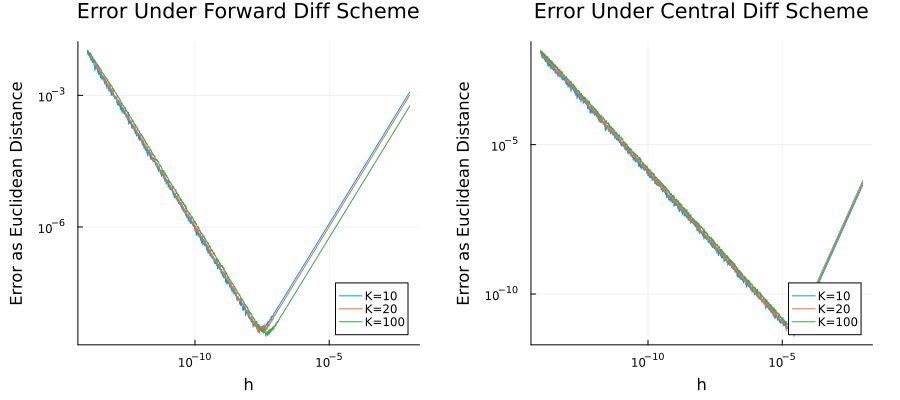

In [17]:
# plots and above description displayed poorly when in one cell: see below for plots
plot(forward_distance_plot, central_distance_plot, size = (900,400), margin=5mm)


---

*Use this area below as an experimental playground for the question. Feel free to leave some of the experimental code here with your submision. However, it will not be marked or reviewed. Make sure in your submission that if there is any experimental code here then running it does not interfere with running the actual solutions.*

---

# Solution to [Question 14](https://courses.smp.uq.edu.au/MATH2504/2023/assessment_html/bighw.html#q14)

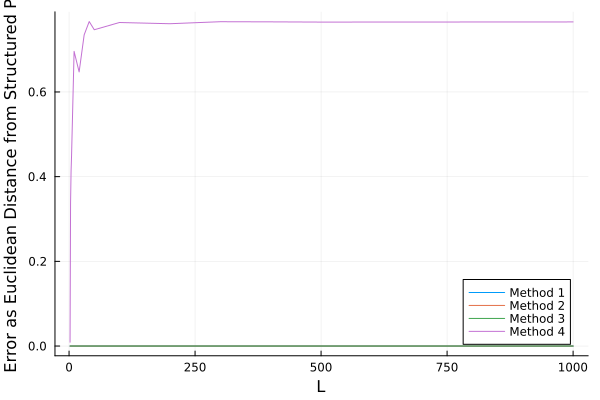

In [5]:
using LinearAlgebra, StatsBase, Plots

function structured_P(L::Int; p::Float64 = 0.45, r::Float64 = 0.01)::Matrix{Float64}
    q = 1 - p - r
    P = diagm(fill(r,L)) + diagm(-1=>fill(q,L-1)) + diagm(1 => fill(p,L-1))
    P[1,1] = 1-p
    P[L,L] = 1-q
    return P
end

structured_π(L::Int; p::Float64 = 0.45, r::Float64 = 0.01)::Vector{Float64} = begin
    q = 1 - p - r
    [(p/q)^i  for i in 1:L] * (q-p) / p / (1-(p/q)^L) #Explicit expression (birth death)
end;


# method 1. to solve π*matrix = π, with condition that pi sums to 1, so
# add a row of 1s to the matrix and the vector and then solve using  pi = A\b
function method_1(L)
    matrix = (I - structured_P(L))' 
    # add row of ones
    onesrow = [1 for i in 1:L]
    matrix = [matrix;onesrow']
    # create a zero vector, with an additional 1
    zerovector = [0 for i in 1:L+1]
    zerovector[L+1] = 1
    method_1_result = matrix\zerovector
    return method_1_result
end


# method 2. choose large n, see if the i-jth element of the matrix to that power is equal
# to the jth element of structured pi.
function method_2(L)
    matrix = structured_P(L)
    stat_prob = structured_π(L)
    n = big(20000) # choose some big n
    limit_matrix = matrix^n
    method_2_result = limit_matrix[1,:]
    return method_2_result
end


# method 3. find eigens of matrix, largest one should be 1. find vector associated with
# evalue 1. vector pi should be proportional to the evector associated with 1. 
function method_3(L)
    matrix = structured_P(L)
    # need the left eigenvectors, so do eigenanalysis on the transpose
    eigvalues, lefteigvectors = eigen(matrix')
    # find the index where λ=1
    eig_max, eig_max_location = findmax(real.(eigvalues))
    # find π using the eigenvector associated with λ=1
    method_3_result = lefteigvectors[:,eig_max_location]/sum(lefteigvectors[:,eig_max_location])
    return method_3_result
end


# method 4
function method_4(L)
    matrix = structured_P(L)
    stat_prob = structured_π(L)
    N = 10000 # choose some large N
    # create a uniform probability distribution and sample from it to generate the first state
    X = [sample(1:L, Weights([1/L for i in 1:L]), 1)...]
    previous_X = X[1]
    states = zeros(N)
    # iterate through to create a sequences of N states. draws from the corresponding row of 
    # the transition matrix, which is the probability of switching from one state to another.
    for n in 1:N
        states[n] = sample(1:L, Weights(matrix[previous_X,:],1))
        previous_X = X[end]
    end
    indicator = zeros(N)
    method_4_result = zeros(L)
    # implement the indicator function: set 1 if X_n=i, and 0 otherwise
    for i in 1:L
        for n in 1:N
            if states[n] == i
                indicator[n] = 1
            else
                indicator[n] = 0
            end
        method_4_result[i] = sum(indicator)/N
        end
    end
    method_4_result = [sum([states[n] == i for n in 1:N]) for i in 1:L]/N
    return method_4_result
end


# plot accuracy of methods (using euclidean distance from structured_pi) as a function of L
l_range = [2, 3, 4, 5, 10, 20, 30, 40, 50, 100, 200, 300, 400, 500, 1000]
accuracy_1 = [norm(method_1(a)-structured_π(a)) for a in l_range]
accuracy_2 = [norm(method_2(a)-structured_π(a)) for a in l_range]
accuracy_3 = [norm(method_3(a)-structured_π(a)) for a in l_range]
accuracy_4 = [norm(method_4(a)-structured_π(a)) for a in l_range]


plot(l_range, [accuracy_1, accuracy_2, accuracy_3, accuracy_4], xlabel="L", 
    ylabel="Error as Euclidean Distance from Structured Pi", 
    label = ["Method 1" "Method 2" "Method 3" "Method 4"], 
    legend= :bottomright)



As a result of including method 4, methods 1 to 3 cannot easily be distinguished. The following plot excludes method 4, and has been included so the accuracy of methods 1 to 3 can actually be seen. See below:

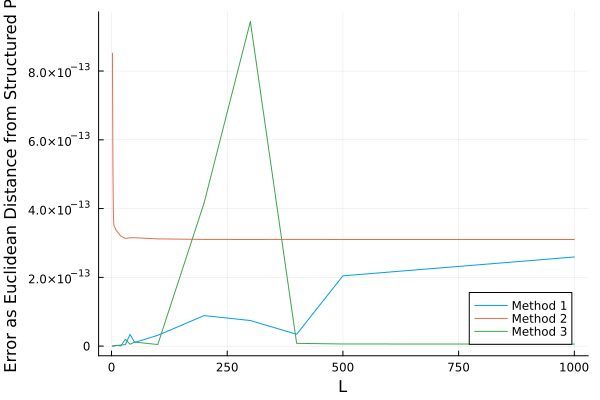

In [6]:
plot(l_range, [accuracy_1, accuracy_2, accuracy_3], xlabel="L", 
    ylabel="Error as Euclidean Distance from Structured Pi", label = ["Method 1" "Method 2" "Method 3"], 
    legend= :bottomright)



---

*Use this area below as an experimental playground for the question. Feel free to leave some of the experimental code here with your submision. However, it will not be marked or reviewed. Make sure in your submission that if there is any experimental code here then running it does not interfere with running the actual solutions.*

---

# Solution to [Question 15](https://courses.smp.uq.edu.au/MATH2504/2023/assessment_html/bighw.html#q15)

## 15a:

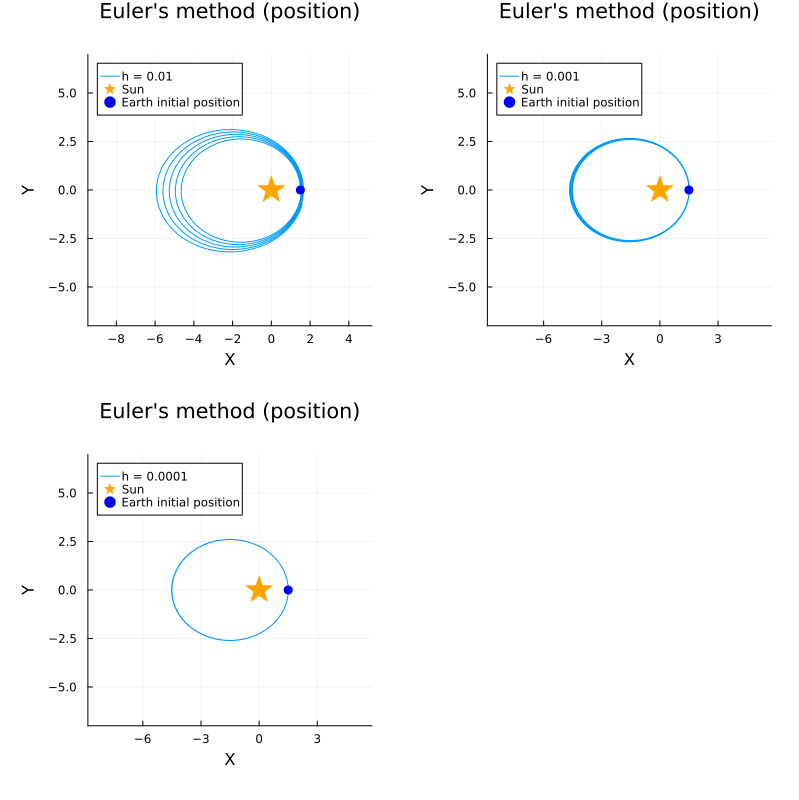

In [7]:
#These four convenience functions extract the state variable from the state vector
#It is assumed the layout of the vector u is u = [v_x, v_y, x, y]
state_v_x(u::Vector{Float64}) = u[1]
state_v_y(u::Vector{Float64}) = u[2]
state_x(u::Vector{Float64}) = u[3]
state_y(u::Vector{Float64}) = u[4]

"""
Computes the RHS for the one body problem. 
"""
function df_dt_one_body(u::Vector{Float64}, t::Float64)::Vector{Float64}
    M, G = 1, 1
    r = sqrt(state_x(u)^2 + state_y(u)^2)
    return [-M*G*state_x(u)/r^3, -M*G*state_y(u)/r^3, state_v_x(u), state_v_y(u)]
end;

using Plots, Measures

function plot_position_solution( t::AbstractArray{T}, 
                        u::Vector{Vector{Float64}}; 
                        title::String = "",
                        label::Union{String, Bool} = false) where T
    x, y, v_x, v_y = state_x.(u), state_y.(u), state_v_x.(u), state_v_y.(u)
 
    #"Position"
    r = @. sqrt(x^2 + y^2)
    E = @. 0.5*(v_x^2 + v_y^2) - 1.0/r
    # create Position plot
    p1 = plot(  x, y, label = label, xlabel= "X", ylabel = "Y",
                title = title*" (position)", aspectratio=1,legend=:topleft,ylim=(-7,7))
    scatter!([0], [0], ms=15, msw=0, c=:orange, shape =:star, label="Sun")
    scatter!([x[1]], [y[1]], ms=5, msw=0, c=:blue, shape =:circle, label="Earth initial position")
    plot(p1, margin = 10mm,size=(800,400))
end;


# use euler's method to find the next u vector
function euler_next_u(u::Vector{Float64}, h::Float64, t::Float64)
    next_u = u + h * df_dt_one_body(u, t)
    return next_u
end

#initialise an empty array to hold the plots
plots_position = []

#define an array containing each step size
h_array = [0.01, 0.001, 0.0001] 

#define initial conditions
u_0 = [0.0, 1, 1.5, 0]

# create plots for position
for (index, h) in enumerate(h_array) #iterate through each stepsize
    
    #initialise an array that holds all the u vectors
    u_array = [u_0]
    
    t_range = 0:h:200
    
    for t in t_range[2:end] #iterate over time values
        #do eulers method for the last added vector to the u array
        next_u = euler_next_u(u_array[end], h, t) 
        push!(u_array, next_u) #add the new vector to the u array
    end
    
    #plot every 10th data point
    push!(plots_position, plot_position_solution(t_range[1:10:end], u_array[1:10:end], 
            title = "Euler's method", label = "h = $h"))
end


plot(plots_position..., size = (800,800), margin = 5mm)



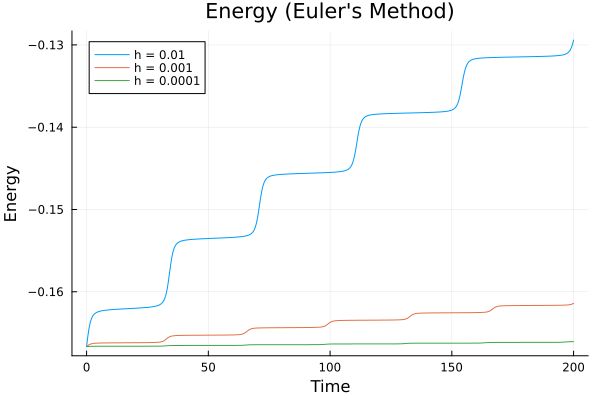

In [8]:
function plot_energy(h; combined = true)
    
    #initial conditions
    u_0 = [0, 1, 1.5, 0]
    t_range = 0:h:200
    
    #initialise an empty plot to store the energies
    energies =[]
    
    for t in t_range
        x, y = state_x(u_0), state_y(u_0)
        v_x, v_y = state_v_x(u_0), state_v_y(u_0)
        
        r = @. sqrt(x^2 + y^2)
        energy  = @. 0.5*(v_x^2 + v_y^2) - 1.0/r
        

        push!(energies, energy) #add the energy vector to the array
        u_0 = euler_next_u(u_0, h, t) #re-define the u vector after each step of Eulers
    end
    
    if combined
        #add to the existing plot when combined is true
        plot!(t_range[1:10:end], energies[1:10:end], 
            label = "h = $h", title = "Energy (Euler's Method)", 
            xlabel = "Time", ylabel = "Energy")
        
    else
        plot(t_range[1:10:end], energies[1:10:end], 
            label = "h = $h", title = "Energy (Euler's Method)", 
            xlabel = "Time", ylabel = "Energy")
    end
end

plot_energy(0.01, combined = false) #create the base plot

# add to the previous plot
plot_energy(0.001)
plot_energy(0.0001)



## 15b:

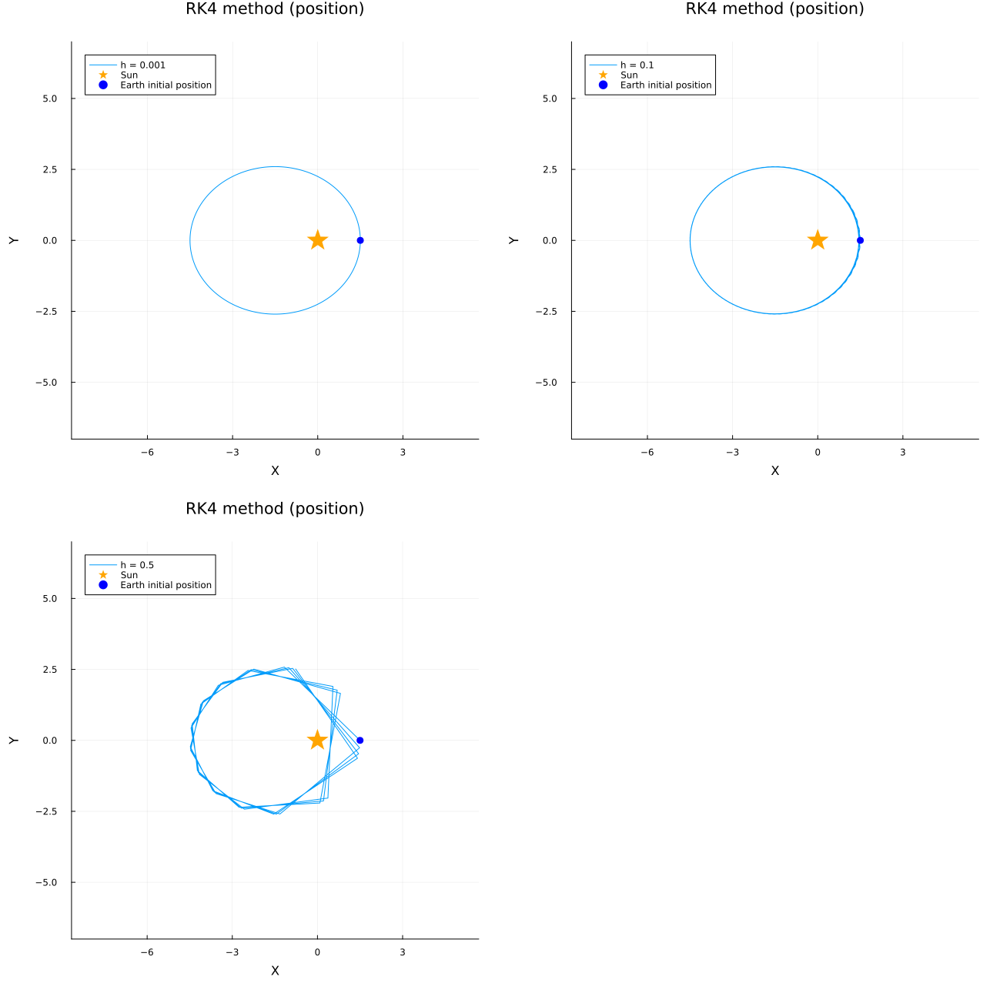

In [9]:
# # Define RK4 method function
function RK4_next_u(u::Vector{Float64}, h::Float64, t::Float64)
    k1 = df_dt_one_body(u, t)
    k2 = df_dt_one_body(u + h*k1/2, t)
    k3 = df_dt_one_body(u + h*k2/2, t)
    k4 = df_dt_one_body(u + h*k3, t)
    
    RK4_next_u = u + ((h/6) *(k1 +2*k2 + 2*k3 + k4))
    return RK4_next_u
end

#initialise an empty array to hold the plots
plots = []

#define an array containing each step size
h_array = [0.001, 0.1, 0.5] 

for (index, h) in enumerate(h_array) #iterate through each stepsize
    
    #define initial conditions
    u_0 = [0.0, 1, 1.5, 0]
    t_range = 0:h:200
    
    #initialise an array that holds all the u vectors
    u_array = [u_0]
    
    for t in t_range[2:end] #iterate over time values
        #do RK4 method for the last added vector to the u array
        next_u = RK4_next_u(u_array[end], h, t) 
        push!(u_array, next_u) #add the new vector to the u array
    end
    
    #plot every 10th data point
    push!(plots, plot_position_solution(t_range[1:10:end], u_array[1:10:end], 
            title = "RK4 method", label = "h = $h"))
    
end


plot(plots..., size = (1300,1300), margin = 5mm, layout = (2,2))



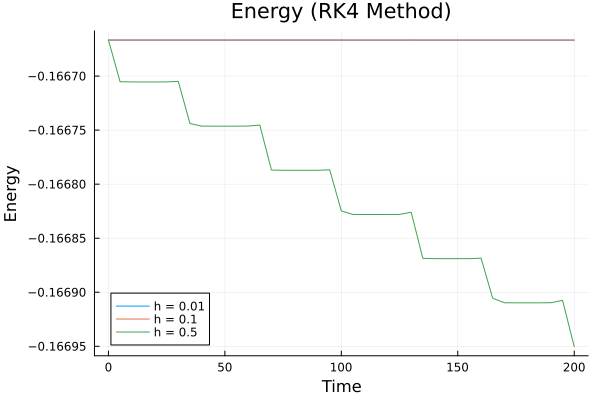

In [10]:
function plot_energy(h; combined = true)
    
    #initial conditions
    u_0 = [0, 1, 1.5, 0]
    t_range = 0:h:200
    
    #initialise an empty plot to store the energies
    energies =[]
    
    for t in t_range
        x, y = state_x(u_0), state_y(u_0)
        v_x, v_y = state_v_x(u_0), state_v_y(u_0)
        
        r = @. sqrt(x^2 + y^2)
        energy  = @. 0.5*(v_x^2 + v_y^2) - 1.0/r
        

        push!(energies, energy) #add the energy vector to the array
        u_0 = RK4_next_u(u_0, h, t) #re-define the u vector after each step of RK4 method
    end
    
    if combined
        #add to the existing plot when combined is true
        plot!(t_range[1:10:end], energies[1:10:end], label = "h = $h", title = "Energy (RK4 Method)", 
            xlabel = "Time", ylabel = "Energy")
        
    else
        plot(t_range[1:10:end], energies[1:10:end], label = "h = $h", title = "Energy (RK4 Method)", 
            xlabel = "Time", ylabel = "Energy")
    end
end

plot_energy(0.01, combined = false) #create the base plot

# add to the previous plot
plot_energy(0.1)
plot_energy(0.5)



The plots for step sizes 0.01 and 0.1 are indistinguishable on this graph's scale. The high order method produces solutions that are accurate for both these step sizes as seen in the position plots. Thus the u vector from which the energy is calculated is expected to be very similar, thus explaining the output above. 

## 15c:

**General Efficiency and Ability to Predict Trajectory**

Implementing Euler's method only requires the df_dt_one_body function to be called once, whereas it is called 4 times in the RK4 method. This leads to the RK4 method having a lower computational efficiency. 

However, the simplicity of Euler's method results in slight deviations in trajectory over a longer time period. Because the trajectory of the Earth around the sun is elliptical, the function is curved between small time periods. However, Euler's method does not acount for this curve. The error that this assumption causes then accumulates with each iteration of the method, resulting in  deviations from the true trajectory. 

The RK4 method is an extension on Euler's method that decreases the accumulated error over each iteration. k1 is the slope at the start of the interval (this is what Euler's method uses). The approximation is then improved by calculating the slopes at 3 additional intermediate points within the interval. The next value of the unknown function is determined by using a weighted average of these 4 slopes. 

**Efficiency as a Function of h**

The RK4 method is a fourth order method, meaning the total accumulated error is of the order O(h<sup>4</sup>). Since Euler's method is a first order method, the error accumulates linearly after each step. Thus the total accumulated error is of order O(h). 

Consider h = 0.001, which was used above for both methods. The total accumulated error in Euler's method is of order 10<sup>-3</sup> wheras the RK4 method has an accumulated error of order 10<sup>-12</sup>. In Euler's method, the approximation of the curve as a straight line becomes more valid as h decreases.

Thus much larger step sizes can be used in the RK4 method to obtain the same amount of accuracy as a smaller step size in Euler's method. 


## 15d:

[ Info: Saved animation to C:\Users\1908l\OneDrive\MATH2504\Matthew-Lynch_Felicity-Caruana-2504-2023-BigHW\notebooks\graph.gif


Plots.AnimatedGif("C:\\Users\\1908l\\OneDrive\\MATH2504\\Matthew-Lynch_Felicity-Caruana-2504-2023-BigHW\\notebooks\\graph.gif")
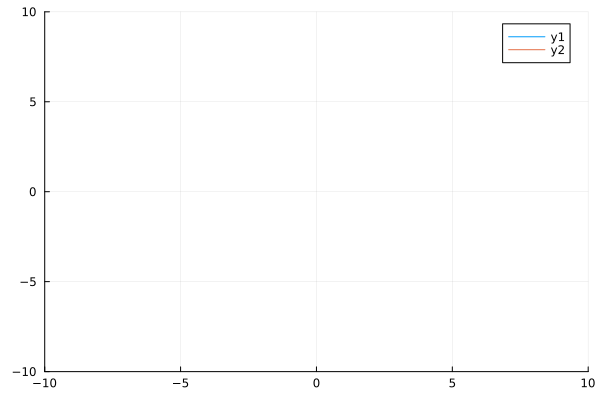

In [24]:
# q15d attempted
using Plots

# plot the best and worst trajectories using the RK4 and euler methods
# based on discussion, use h=0.01 for RK4 method as the best and h=0.01 for euler's method as the worst
u0 = [0.0, 1, 1.5, 0]

function motiongif(a::Function, b::Function, u0, h1, t)
    
    anim = Animation()
    badx = []
    bady = []
    goodx = []
    goody = []
    for i in 1:10:t
        worst_traj = a(u0, h1, t)
        best_traj = b(u0, h1, t) 
        push!(badx, state_x(worst_traj))
        push!(bady, state_y(worst_traj))
        push!(goodx, state_x(best_traj))
        push!(goody, state_x(worst_traj))
        scatter!([0], [0], ms=15, msw=0, c=:orange, shape =:star, label="Sun")
        scatter!([1], [1], ms=5, msw=0, c=:blue, shape =:circle, label="Earth initial position")
        plot(badx, bady, xlim=(-10,10), ylim = (-10, 10))
        plot!(goodx, goody, xlim = (-10, 10), ylim = (-10, 10))
        frame(anim)
    end
    gif(anim, "graph.gif", fps=30)
end

motiongif(euler_next_u, RK4_next_u, u0, 0.01, 500.0)




---

*Use this area below as an experimental playground for the question. Feel free to leave some of the experimental code here with your submision. However, it will not be marked or reviewed. Make sure in your submission that if there is any experimental code here then running it does not interfere with running the actual solutions.*

---

# Solution to [Question 16](https://courses.smp.uq.edu.au/MATH2504/2023/assessment_html/bighw.html#q16)

## 16a:

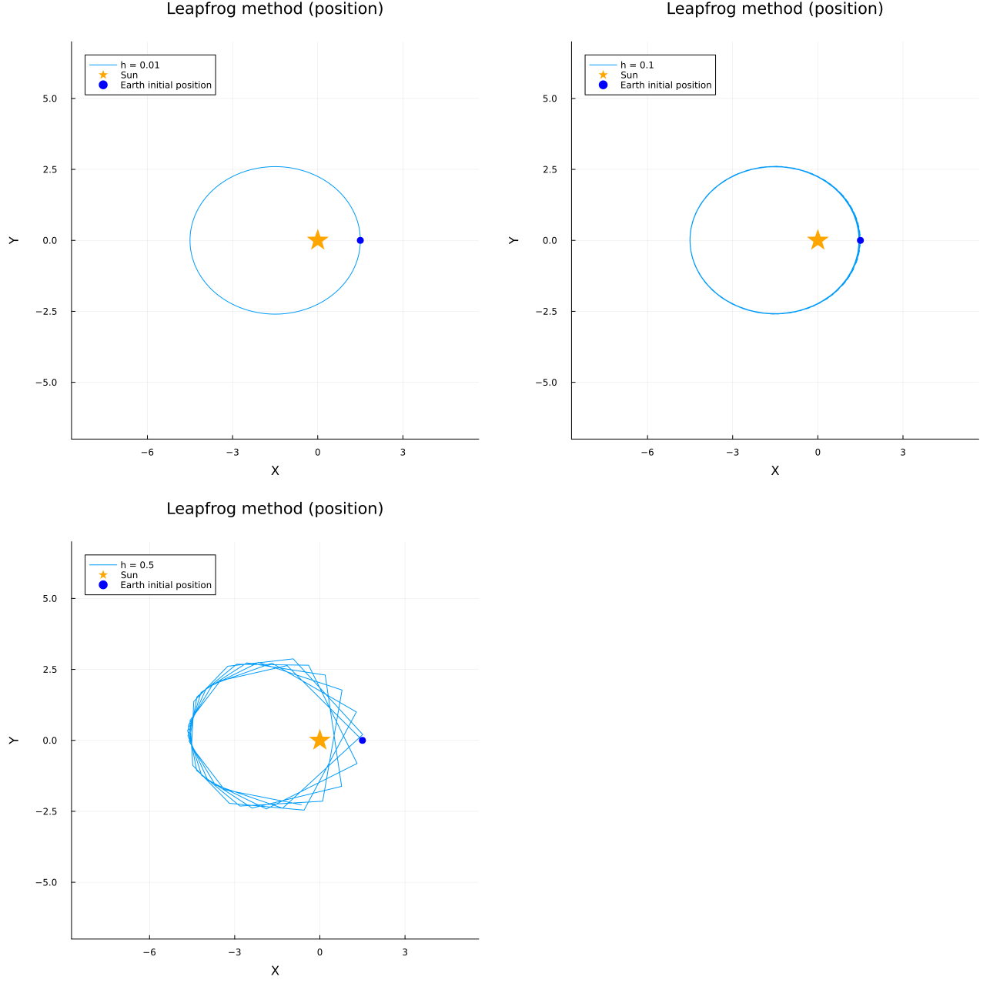

In [12]:
function accel(u::Vector{Float64}, t::Float64)::Vector{Float64}
    a_x, a_y = df_dt_one_body(u, t)[1], df_dt_one_body(u, t)[2]
    a = [a_x, a_y]
    return a
end

function leapfrog_step(u::Vector{Float64}, h::Float64, t::Float64)
    #define velocity and position components
    v_x, v_y = u[1], u[2]
    u_x, u_y = u[3], u[4]
    
    #define intermediate velocities
    v_x_half = v_x + h/2 * accel(u, t)[1]
    v_y_half = v_y + h/2 * accel(u, t)[2]
    
    #update the system
    u_x_next = u_x + h * v_x_half
    u_y_next = u_y + h * v_y_half
    u_next = [v_x_half, v_y_half, u_x_next, u_y_next]
    
    v_x_next = v_x_half + h/2 * accel(u_next, t)[1]
    v_y_next = v_y_half + h/2 * accel(u_next, t)[2]
    
    leap_u = [v_x_next, v_y_next, u_x_next, u_y_next]

    return leap_u
end


#initialise an empty array to hold the plots
plots = []

#define an array containing each step size
h_array = [0.01, 0.1, 0.5] 


for h in h_array #iterate through each stepsize
    
    #define initial conditions
    u_0 = [0.0, 1, 1.5, 0]
    t_range = 0:h:200
    
    #initialise an array that holds all the u vectors
    u_array = [u_0]
    
    for t in t_range[2:end] #iterate over time values
        #do leapfrog method for the last added vector to the u array
        next_u = leapfrog_step(u_array[end], h, t) 
        push!(u_array, next_u) #add the new vector to the u array
    end
    
    #plot every 10th data point
    push!(plots, plot_position_solution(t_range[1:10:end], u_array[1:10:end], title = "Leapfrog method", 
            label = "h = $h"))
    
end


plot(plots..., size = (1300,1300), margin = 5mm, layout = (2,2))



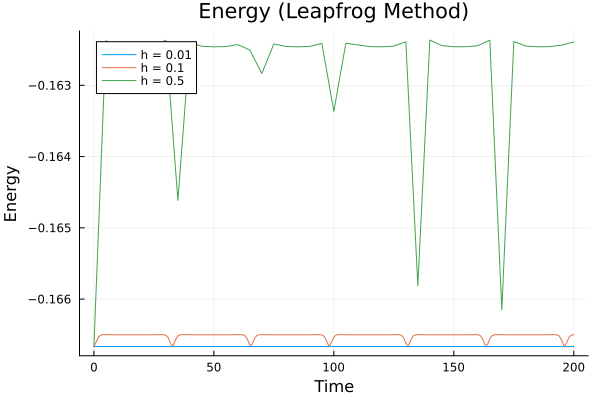

In [13]:
function plot_energy(h; combined = true)
    
    #initial conditions
    u_0 = [0, 1, 1.5, 0]
    t_range = 0:h:200
    
    #initialise an empty plot to store the energies
    energies =[]
    
    for t in t_range
        x, y = state_x(u_0), state_y(u_0)
        v_x, v_y = state_v_x(u_0), state_v_y(u_0)
        
        r = @. sqrt(x^2 + y^2)
        energy  = @. 0.5*(v_x^2 + v_y^2) - 1.0/r
        

        push!(energies, energy) #add the energy vector to the array
        u_0 = leapfrog_step(u_0, h, t) #re-define the u vector after each step of RK4 method
    end
    
    if combined
        #add to the existing plot when combined is true
        plot!(t_range[1:10:end], energies[1:10:end], label = "h = $h", title = "Energy (Leapfrog Method)", 
            xlabel = "Time", ylabel = "Energy")
        
    else
        plot(t_range[1:10:end], energies[1:10:end], label = "h = $h", title = "Energy (Leapfrog Method)", 
            xlabel = "Time", ylabel = "Energy")
    end
end

plot_energy(0.01, combined = false) #create the base plot

# add to the previous plot
plot_energy(0.1)
plot_energy(0.5)



## 16b:

All methods call the df_dt_one_body function In this function, the calculation of r requires 4 FLOPs. The components of the velocity each require doing a division, power, and 2 multiplications (4 FLOPs each so 8 altogether). Thus the df_dt_one_body function has 12 FLOPs.

Being the most simple ODE solver, Euler's method requires the least computational effort. It calls the df_dt_one_body function once (12 FLOPs) and then completes addition and multiplication (an additional 2 FLOPs). So my implementation of Euler's method does 14 FLOPs per time step. 

The RK4 method calls the df_dt_one_body function 4 times (thus 48 FLOPs) which is already alot more operations than Euler's method. In defining the k values, it also completes 8 additional FLOPs. Finally in defining the next u vector, the implemenation requires another 8 FLOPs. So altogether, 64 FLOPs per time step. The accuracy of the method clearly requires alot more computational effort (almost 5 times more than Euler's method).

In my implemenation of the leapfrog method, the df_dt_one_body function is called twice (24 FLOPs). In leapfrog_step, an additional 12 FLOPs are completed. So altogether my implementation requires a total of 36 FLOPs. 

Whilst Euler's method requires signifcantly less FLOPs per step, it has been discussed and can be observed in the plots that it is only reasonable for very small step sizes. However, the plots for the two smallest step sizes for the RK4 method and leapfrog method are almost indistinguishable and both resemble what we would expect that trajectory to look like. So the high accuracy is common for both methods. However, the RK4 method requires almost double the computational power than that of the leapfrog method. So, it seems the leapfrog method is the perfect trade off between accuracy and computational effort. 

## 16c:

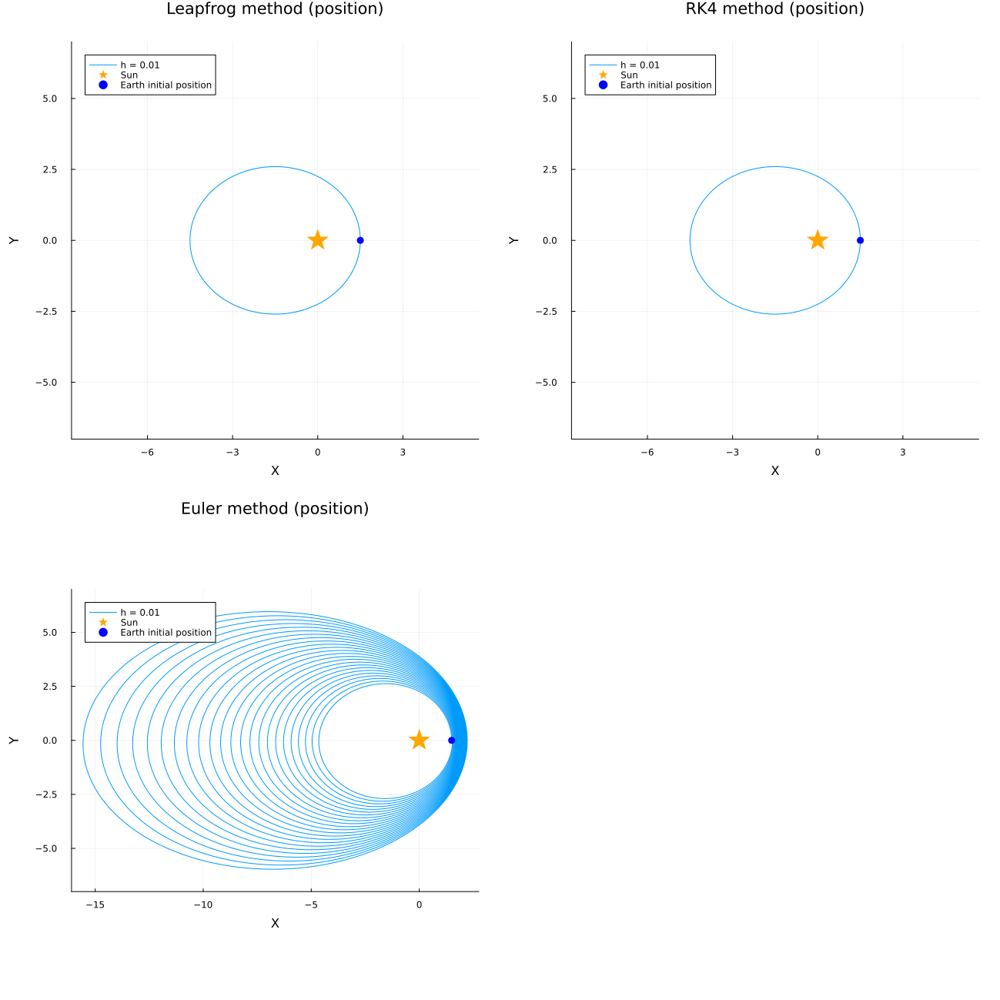

In [14]:
#initialise an empty array to hold the plots
plots = []
h = 0.01

#define initial conditions
u_0 = [0.0, 1, 1.5, 0]
t_range = 0:h:2000
    
#initialise an array that holds all the u vectors
u_array_leapfrog = [u_0]
u_array_RK4 = [u_0]
u_array_Euler = [u_0]
    
for t in t_range[2:end] #iterate over time values
    #do leapfrog method for the last added vector to the u array
    next_u_leap = leapfrog_step(u_array_leapfrog[end], h, t) 
    next_u_RK4= RK4_next_u(u_array_RK4[end], h, t) 
    next_u_Euler = euler_next_u(u_array_Euler[end], h, t) 
        
    push!(u_array_leapfrog, next_u_leap) #add the new vector to the u array
    push!(u_array_RK4, next_u_RK4)
    push!(u_array_Euler, next_u_Euler)
        
end
    
#plot every 10th data point
push!(plots, plot_position_solution(t_range[1:10:end], u_array_leapfrog[1:10:end], 
        title = "Leapfrog method", label = "h = $h"))
push!(plots, plot_position_solution(t_range[1:10:end], u_array_RK4[1:10:end], 
        title = "RK4 method", label = "h = $h"))
push!(plots, plot_position_solution(t_range[1:10:end], u_array_Euler[1:10:end], 
        title = "Euler method", label = "h = $h"))

plot!(plots..., size = (1300,1300), margin = 5mm)



I have chosen the time range to be from 0 to 2000 with step sizes of 0.01 for all methods. Observing the three trajectory plots for each method verifies that long simulation runs have very little effect on the accuracy of the trajectory for the RK4 and leapfrog method. However, a huge amount of deviation can be observed in Euler's method due to the accumulated error being directly proportional to step size. The error increases linearly as each step is taken, so over longer simulations, a large error is accumulated.

## 16d:

┌ Warning: dt(2.842170943040401e-14) <= dtmin(2.842170943040401e-14) at t=1.12509072310017, and step error estimate = 0.5236235235534891. Aborting. There is either an error in your model specification or the true solution is unstable.
└ @ SciMLBase C:\Users\1908l\.julia\packages\SciMLBase\kTUaf\src\integrator_interface.jl:599


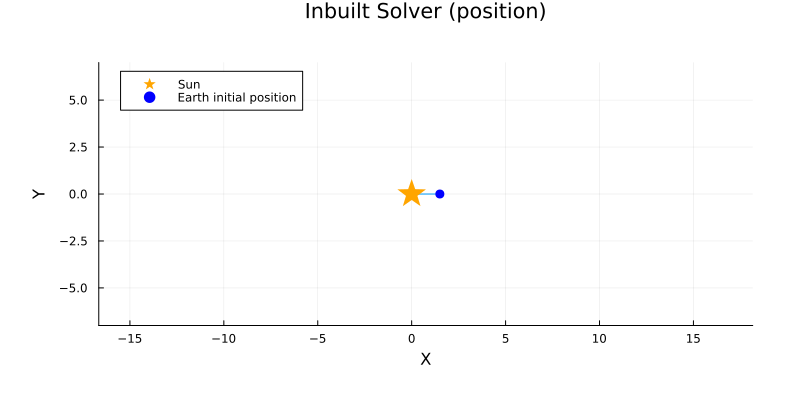

In [15]:
using DifferentialEquations
using Plots, Measures

#These four convenience functions extract the state variable from the state vector
#It is assumed the layout of the vector u is u = [v_x, v_y, x, y]
state_v_x(u::Vector{Float64}) = u[1]
state_v_y(u::Vector{Float64}) = u[2]
state_x(u::Vector{Float64}) = u[3]
state_y(u::Vector{Float64}) = u[4]

function df_dt_one_body(u::Vector{Float64}, t::Float64)::Vector{Float64}
    M, G = 1, 1
    r = sqrt(state_x(u)^2 + state_y(u)^2)
    return [-M*G*state_x(u)/r^3, -M*G*state_y(u)/r^3, state_v_x(u), state_v_y(u)]
end;

function plot_position_solution( t::AbstractArray{T}, 
                        u::Vector{Vector{Float64}}; 
                        title::String = "",
                        label::Union{String, Bool} = false) where T
    x, y, v_x, v_y = state_x.(u), state_y.(u), state_v_x.(u), state_v_y.(u)
 
    # create Position plot
    p1 = plot(  x, y, label = label, xlabel= "X", ylabel = "Y",
                title = title*" (position)", aspectratio=1,legend=:topleft,ylim=(-7,7))
    scatter!([0], [0], ms=15, msw=0, c=:orange, shape =:star, label="Sun")
    scatter!([x[1]], [y[1]], ms=5, msw=0, c=:blue, shape =:circle, label="Earth initial position")
    plot(p1, margin = 10mm,size=(800,400))
end;

function system_of_ODEs(du::Vector{Float64},u::Vector{Float64},p, t::Float64)
    #note the u vector is of the form [v_x, v_y, x, y]
    M, G = 1,1
    r = sqrt(u[3]^2 + u[4]^2)
    
    one_body_solution = df_dt_one_body(u, t)
    
    #extract velocities
    du[1] = one_body_solution[3]
    du[2] = one_body_solution[4]
    
    #extract accelerations
    du[3] = one_body_solution[1]
    du[4] = one_body_solution[2]

end

#define initial conditions and time interval
t_range = (0.0, 200.0)
u_0 = [0.0, 1, 1.5, 0]


#define the IVP
ODE_problem = ODEProblem(system_of_ODEs, u_0, t_range)

#use an inbuiltm method ODE solver to obtain the solution
solution = solve(ODE_problem, Tsit5())
 
#extract the time and u vectors from the solution
t = solution.t
u = solution.u

plot_position_solution(t, u, title = "Inbuilt Solver")



---

*Use this area below as an experimental playground for the question. Feel free to leave some of the experimental code here with your submision. However, it will not be marked or reviewed. Make sure in your submission that if there is any experimental code here then running it does not interfere with running the actual solutions.*

---

# Solution to [Question 17](https://courses.smp.uq.edu.au/MATH2504/2023/assessment_html/bighw.html#q17)

In Dr Dawson’s seminar, she discussed her educational and career paths, and how she uses programming and mathematics in her line of work. Initially, she completed a Bachelor of Mechatronics at QUT. Although her undergraduate studies did not focus specifically on mathematics and software use, she uses such tools heavily. She has gained on-the-job experience in cloud computing, Julia, Python, MATLAB and C++, among others.

After completing her undergraduate studies, she undertook an internship at CSIRO, during which she worked to develop an autonomous vision-based target detection system for an underwater vehicle.  A key point she made was that the language that’s best for writing in may not be the best language for actually executing the program; languages that are easy to code in may take longer to execute than less-intuitive languages. However, she said that Julia is appealing because it can be both easy to use and easily implemented. Knowing that Julia is actually a key tool used in research and industry does make the difficulty of this course feel worth it.

Following her work at CSIRO, she completed a PhD at UQ, which focused on statistical analysis of orientation and TDOA-based geolocation estimation – in doing this, she had to answer key questions about how position estimates are generated, such as how predictors perform in different situations, if a solution can be generated and how accurate this solution is. After completing her PhD, she worked at multiple positions, including for Shell, Origin Energy and Boeing.

Dr Dawson currently works at Fugro, a leading company in the energy, infrastructure and water markets. In this position, she works as a team lead in Fugro Roames, which assesses and monitors powerline infrastructure over a large area for clients. Her team is responsible for taking the data gathered via LIDAR and autonomously classifying the physical structures, which creates a 3D image of the area. A key point I picked up is that a significant part of many of her jobs is being able to predict and fix complications in a solution she’s created for a given problem. For example, she and her team at Fugro need to be able to identify and deal with the risks and uncertainties associated with taking a single LIDAR scan of an area that may change over time. As I continue in my studies and career, I think it will be useful to remember that coming up with a solution – whether it be programmatic or mathematic in nature – is only the first step in solving real-world problems. In reality, much more work is done in fixing things as they break and improving on existing solutions.
